# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [6]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-0.325469,-5.734784,8.839868,-9.396178,-5.845898,2.553704,0.398691,10.783719
1,8.170293,5.424829,4.517417,2.066946,-5.297860,-9.033385,1.310264,-1.242111
2,9.437770,8.602882,2.453166,-1.907255,-3.731789,-8.908968,2.859789,-2.178864
3,7.347617,6.964246,7.072512,7.978054,-8.628300,-4.596875,2.132879,-1.450105
4,8.912810,4.679878,2.456623,-0.068195,-6.873016,-7.718297,0.879850,-2.217185


In [7]:
from itertools import combinations

In [8]:
lst_vars=list(combinations(df1.columns,2))

In [9]:
len(lst_vars)

28

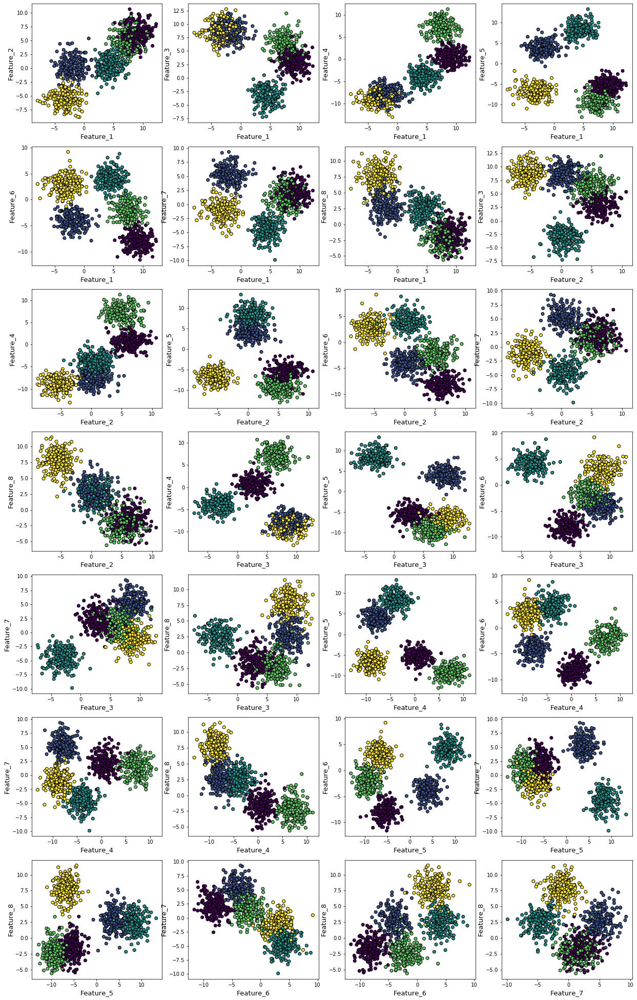

In [10]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [12]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,3.183344,5.077152,-7.880291,-2.015547,4.415398,7.604003,12.252769
Feature_2,1000.0,1.380538,4.436479,-8.810566,-1.203943,1.547729,5.201743,10.678509
Feature_3,1000.0,4.702388,4.726496,-7.270106,1.953005,6.182344,8.376238,12.760218
Feature_4,1000.0,-2.553127,6.092323,-13.085846,-7.882337,-3.803224,1.557956,11.253176
Feature_5,1000.0,-1.831621,6.917379,-13.067648,-7.601555,-4.932145,4.731915,13.225418
Feature_6,1000.0,-1.447424,4.719503,-11.616909,-4.933000,-1.922270,3.076092,9.173709
Feature_7,1000.0,0.665248,3.650033,-9.882513,-1.996021,1.022151,3.468035,9.335858
Feature_8,1000.0,1.865362,3.901471,-5.607533,-1.458003,1.797032,4.222390,11.469318


### How are the classes separated (boxplots)

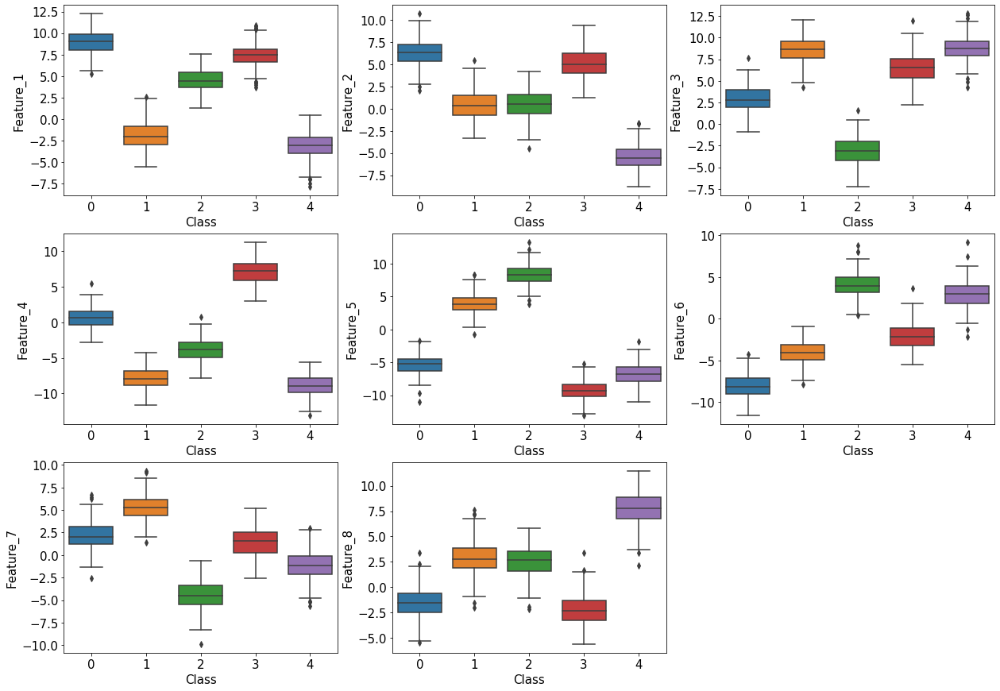

In [13]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [14]:
from sklearn.cluster import KMeans

### Unlabled data

In [15]:
X=df1

In [16]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-0.325469,-5.734784,8.839868,-9.396178,-5.845898,2.553704,0.398691,10.783719
1,8.170293,5.424829,4.517417,2.066946,-5.297860,-9.033385,1.310264,-1.242111
2,9.437770,8.602882,2.453166,-1.907255,-3.731789,-8.908968,2.859789,-2.178864
3,7.347617,6.964246,7.072512,7.978054,-8.628300,-4.596875,2.132879,-1.450105
4,8.912810,4.679878,2.456623,-0.068195,-6.873016,-7.718297,0.879850,-2.217185


In [17]:
y=data1[1]

### Scaling

In [18]:
from sklearn.preprocessing import MinMaxScaler

In [19]:
scaler = MinMaxScaler()

In [20]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [21]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [22]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -237.17338797628747
Silhouette score for number of cluster(s) 2: 0.4545544210965961
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -121.99351566187147
Silhouette score for number of cluster(s) 3: 0.5783071310485334
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -65.15757024300395
Silhouette score for number of cluster(s) 4: 0.6343205044567053
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -42.9855746841138
Silhouette score for number of cluster(s) 5: 0.5890466682144815
V-measure score for number of cluster(s)

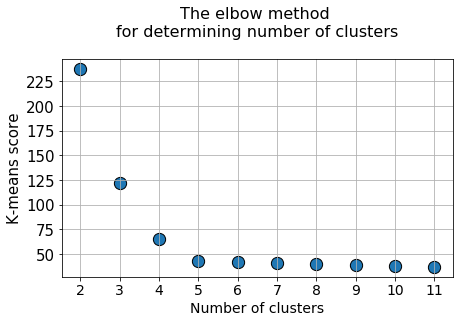

In [23]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()

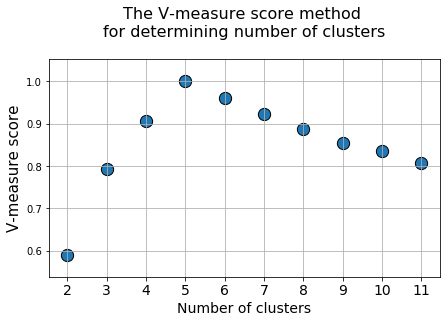

In [24]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()

In [25]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [26]:
preds_km = km.predict(X_scaled)

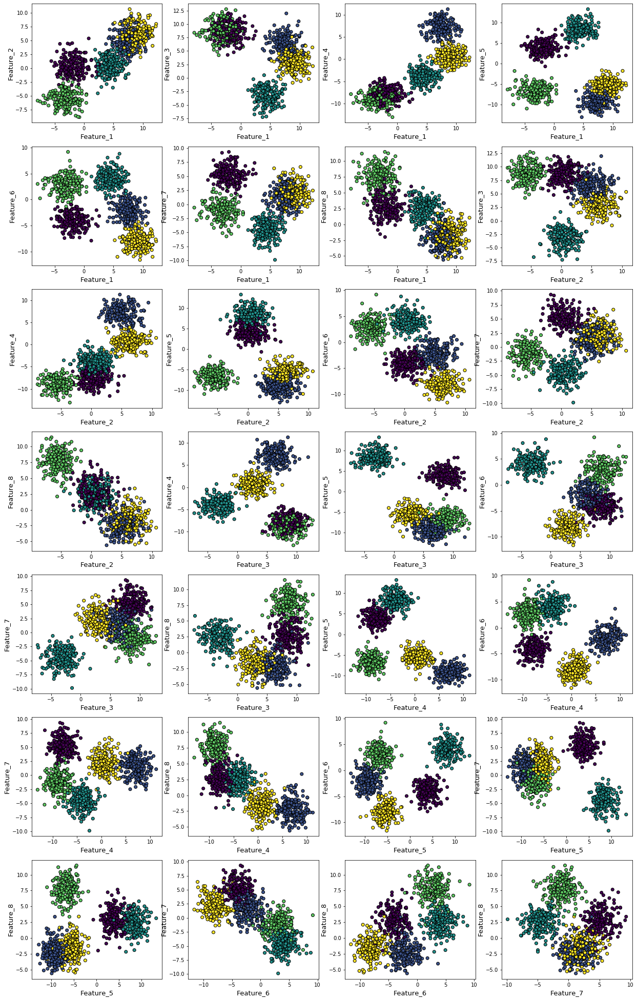

In [27]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [28]:
from sklearn.mixture import GaussianMixture

In [29]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -12471.826791672242
Log-likelihood score for number of cluster(s) 2: 6.543308505750826
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14065.394785851473
Log-likelihood score for number of cluster(s) 3: 7.49551699661754
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -14658.274790729294
Log-likelihood score for number of cluster(s) 4: 7.947381492833549
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -14832.074574036007
Log-likelihood score for number of cluster(s) 5: 8.189705878264002
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -14588.27356917735
Log-likelihood score for number of cluster(s) 6: 8.223229869611773
---

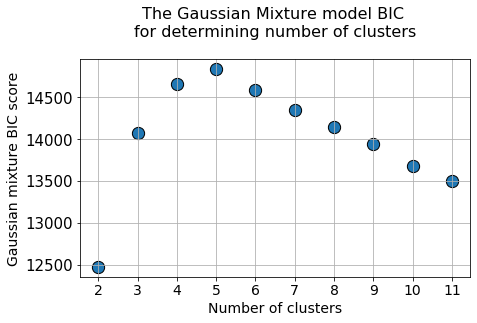

In [30]:
plt.figure(figsize=(7,4))
plt.title("The Gaussian Mixture model BIC \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("Gaussian mixture BIC score",fontsize=14)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

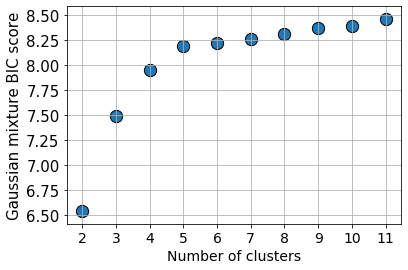

In [31]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("Gaussian mixture BIC score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

In [32]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [37]:
gm.means_

array([[0.23637261, 0.17082479, 0.8003796 , 0.17342152, 0.2400946 ,
        0.69731997, 0.45471962, 0.78092113],
       [0.83760232, 0.77688478, 0.50711828, 0.5651368 , 0.2923081 ,
        0.17055491, 0.62778493, 0.23808298],
       [0.61563575, 0.4799929 , 0.20328493, 0.37754212, 0.81379232,
        0.75484468, 0.28003851, 0.47493713],
       [0.75971497, 0.71211874, 0.68521729, 0.83221702, 0.14465304,
        0.45957348, 0.5902287 , 0.19760592],
       [0.2982847 , 0.47473197, 0.79263389, 0.21549675, 0.64580742,
        0.36346566, 0.79140645, 0.49646227]])

In [38]:
km.cluster_centers_

array([[0.2982847 , 0.47473197, 0.79263389, 0.21549675, 0.64580742,
        0.36346566, 0.79140645, 0.49646227],
       [0.7597156 , 0.71212027, 0.68520743, 0.83218675, 0.1446767 ,
        0.45955077, 0.590232  , 0.1975957 ],
       [0.61563575, 0.4799929 , 0.20328493, 0.37754212, 0.81379232,
        0.75484468, 0.28003851, 0.47493713],
       [0.23637261, 0.17082479, 0.8003796 , 0.17342152, 0.2400946 ,
        0.69731997, 0.45471962, 0.78092113],
       [0.83761999, 0.77689847, 0.5070863 , 0.56510431, 0.29231913,
        0.17050971, 0.62779046, 0.23810271]])

In [39]:
gm.means_/km.cluster_centers_

array([[0.79243963, 0.35983418, 1.00977211, 0.80475235, 0.3717743 ,
        1.91853055, 0.57457153, 1.57297175],
       [1.10252088, 1.09094603, 0.74009454, 0.67909853, 2.02042277,
        0.37113399, 1.06362402, 1.2048996 ],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [3.21405665, 4.16870846, 0.85611539, 4.79881068, 0.6024835 ,
        0.65905681, 1.2980058 , 0.2530421 ],
       [0.35610981, 0.6110605 , 1.56311441, 0.38133977, 2.20925472,
        2.13164204, 1.26062198, 2.08507609]])

In [40]:
preds_gm=gm.predict(X_scaled)

In [41]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [42]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [44]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [45]:
silhouette_score(X_scaled,preds_km)

0.5890466682144815

In [46]:
silhouette_score(X_scaled,preds_gm)

0.5890466682144815

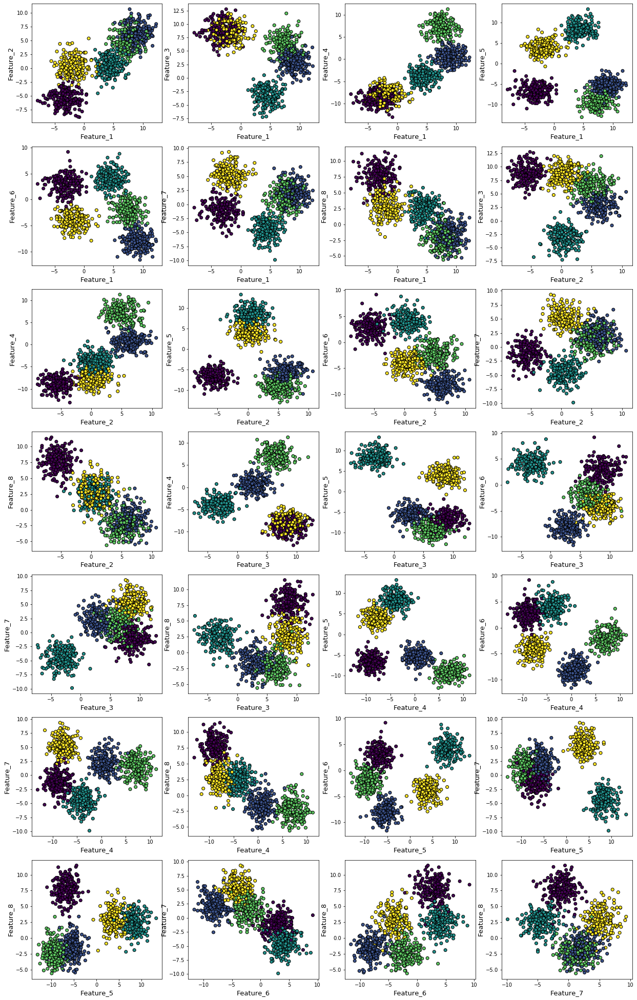

In [47]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [97]:
from sklearn.decomposition import PCA

In [98]:
n_prin_comp = 4

In [99]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=4, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [100]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [101]:
pca_explained_var = pca_full.explained_variance_ratio_

In [102]:
cum_explaiend_var = pca_explained_var.cumsum()

In [103]:
cum_explaiend_var

array([0.50860428, 0.77222898, 0.90856295, 0.94811532, 0.96463132,
       0.97846428, 0.98983976, 1.        ])

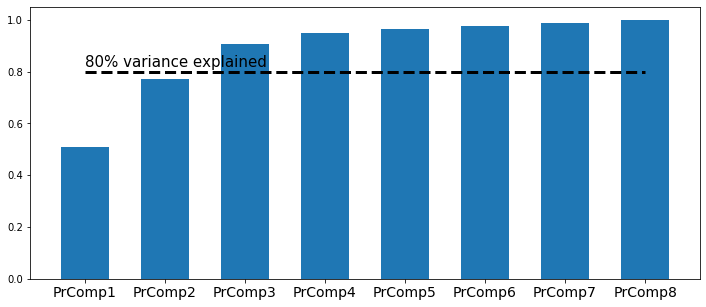

In [104]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [105]:
X_pca = pca_partial.fit_transform(X_scaled)

In [106]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [107]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -214.22774758358184
Silhouette score for number of cluster(s) 2: 0.49599083613423217
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -99.0544085492715
Silhouette score for number of cluster(s) 3: 0.6393856189675439
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -42.268965850701406
Silhouette score for number of cluster(s) 4: 0.7211541047421904
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -20.175619303900262
Silhouette score for number of cluster(s) 5: 0.7084008285054048
V-measure score for number of cluster(

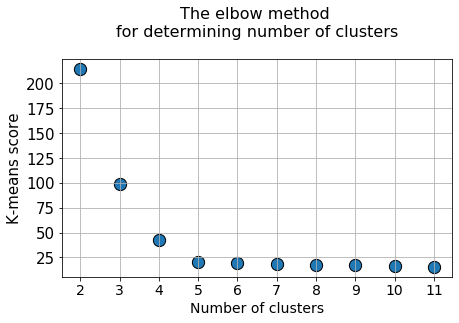

In [108]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


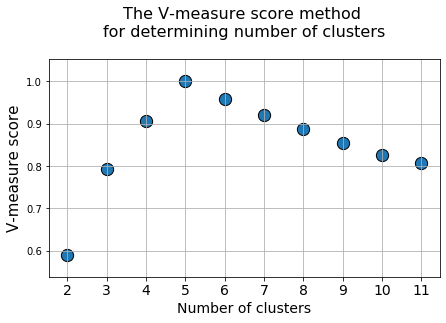

In [109]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()


### K-means fitting with PCA-transformed data

In [110]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [111]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

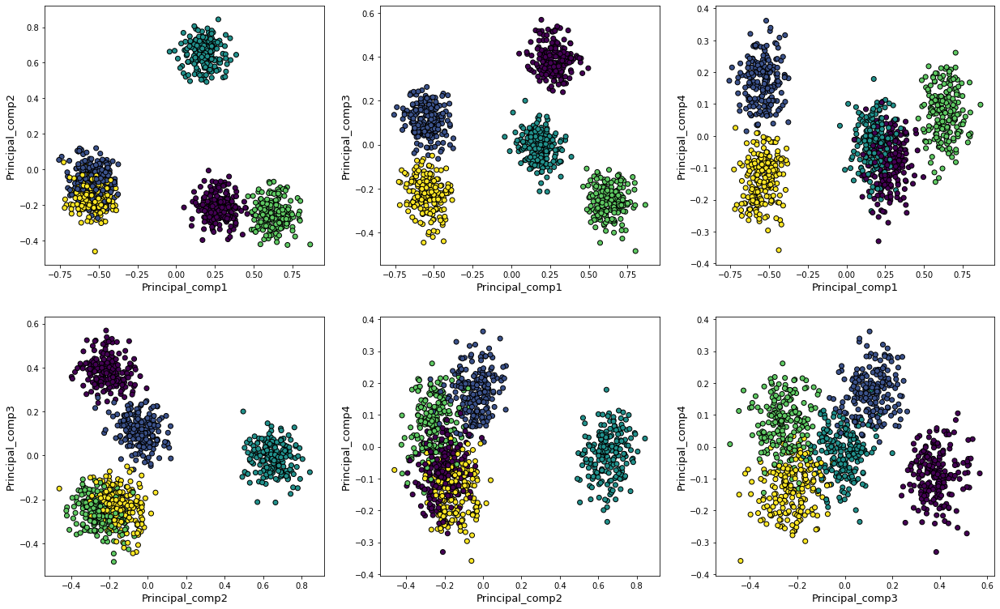

In [112]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA

In [90]:
from sklearn.decomposition import FastICA

In [91]:
n_ind_comp = 3

In [92]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [93]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/larissahubschneider/anaconda3/envs/ds1-copy1/lib/python3.6/site-packages/sklearn/decomposition/_fastica.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [94]:
X_ica = ica_partial.fit_transform(X_scaled)

In [95]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [96]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.046791563089058
Silhouette score for number of cluster(s) 2: 0.42399485082435884
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.0883996233642792
Silhouette score for number of cluster(s) 3: 0.6044304472765866
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.1933185241712299
Silhouette score for number of cluster(s) 4: 0.7882904851489589
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.11034469277385826
Silhouette score for number of cluster(s) 5: 0.7135639514076152
V-measure score for number of cluste

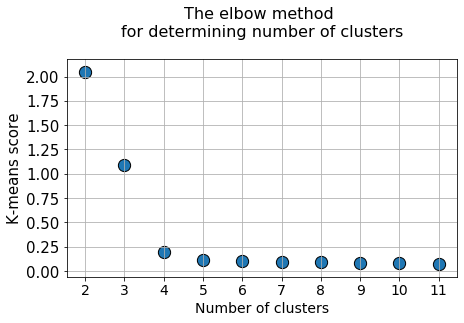

In [97]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


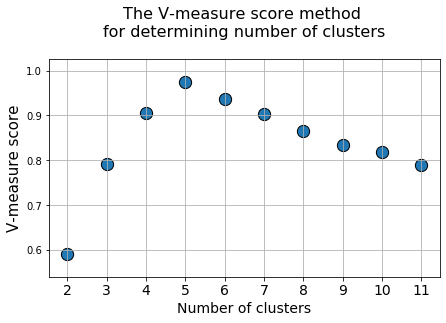

In [98]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()



### K-means fitting with ICA-transformed data

In [99]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [100]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

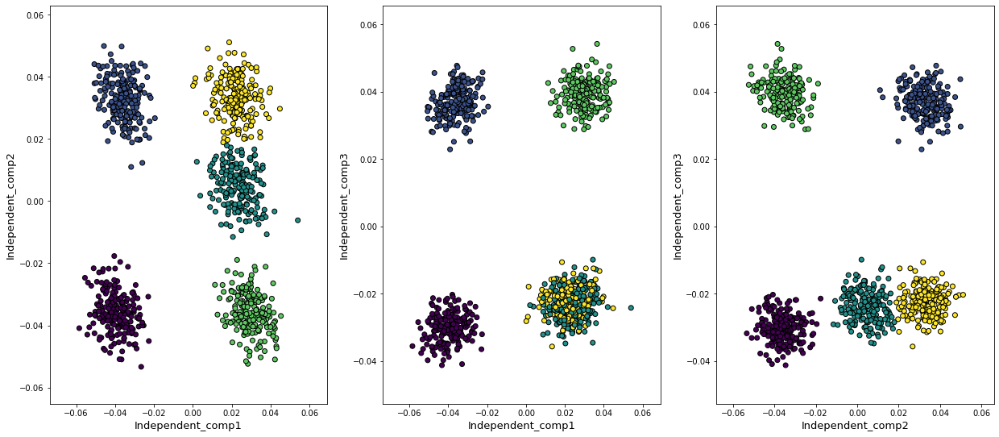

In [101]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [123]:
from sklearn.random_projection import GaussianRandomProjection

In [124]:
n_random_comp = 3

In [125]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [126]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [127]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [128]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -167.4448518234588
Silhouette score for number of cluster(s) 2: 0.6259067360291617
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -96.5850460048683
Silhouette score for number of cluster(s) 3: 0.4884211808421119
V-measure score for number of cluster(s) 3: 0.688721973803127
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -67.5124390479947
Silhouette score for number of cluster(s) 4: 0.45765369042313336
V-measure score for number of cluster(s) 4: 0.745977036180455
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -51.078310396741074
Silhouette score for number of cluster(s) 5: 0.4755289848584125
V-measure score for number of cluster(s) 5

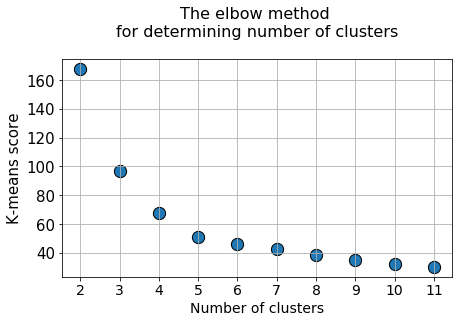

In [129]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


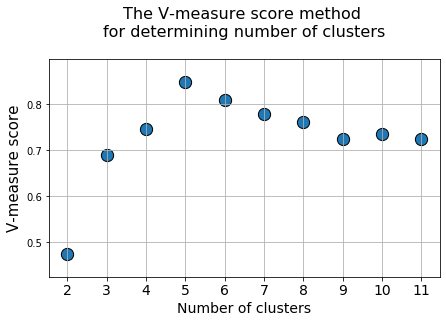

In [130]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()


### K-means fitting with random-projected data

In [131]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [132]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

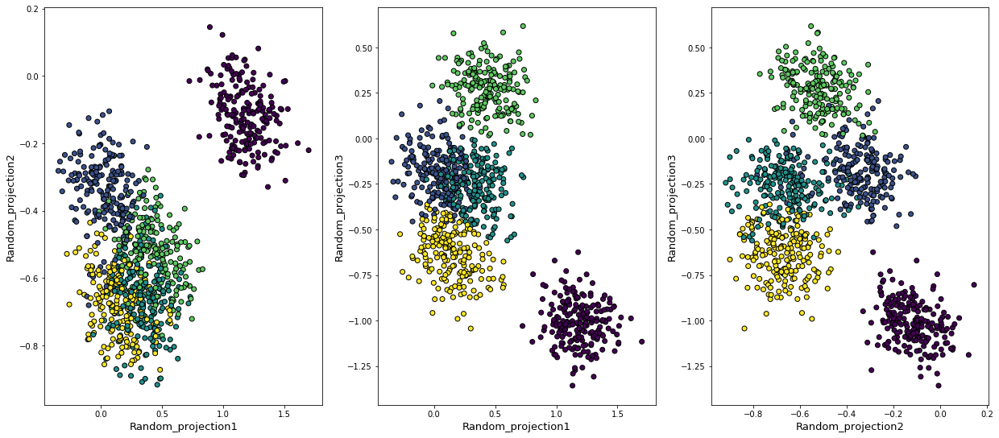

In [133]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [134]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -31.241945265820334
Silhouette score for iteration 0: 0.41048238081862926
V-measure score for iteration 0: 0.5903020356603129
----------------------------------------------------------------------------------------------------


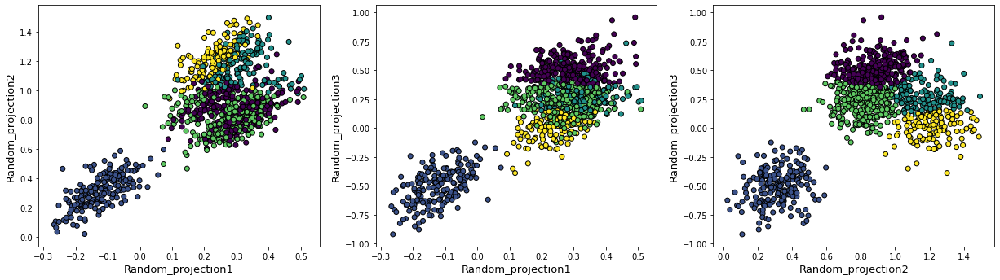

Score for iteration 1: -69.99463545722686
Silhouette score for iteration 1: 0.565266674150272
V-measure score for iteration 1: 0.9590879505937505
----------------------------------------------------------------------------------------------------


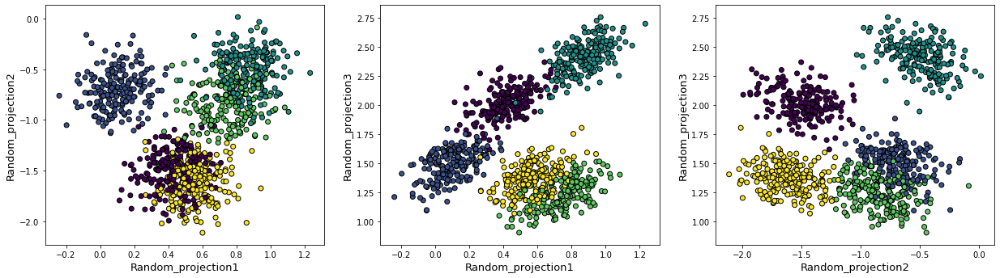

Score for iteration 2: -61.9885247005498
Silhouette score for iteration 2: 0.6479957916867991
V-measure score for iteration 2: 0.9679640834719796
----------------------------------------------------------------------------------------------------


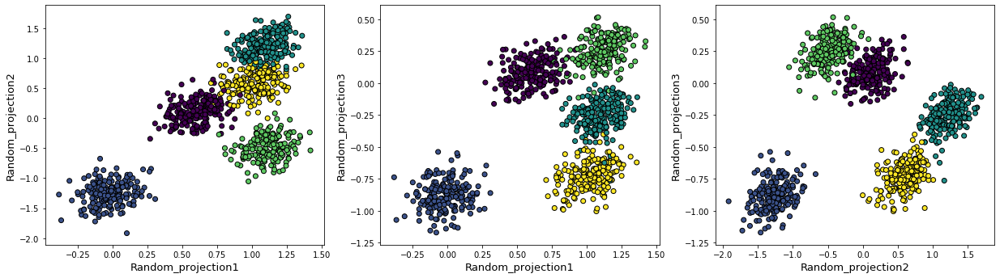

Score for iteration 3: -25.348511692053396
Silhouette score for iteration 3: 0.39527098256932425
V-measure score for iteration 3: 0.7782831179769044
----------------------------------------------------------------------------------------------------


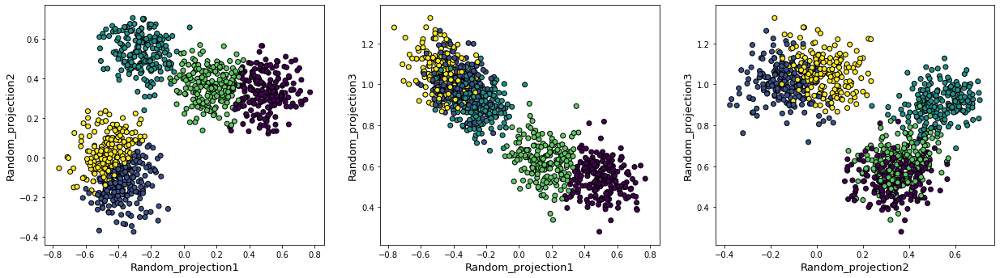

Score for iteration 4: -37.36659048811963
Silhouette score for iteration 4: 0.5083541244176515
V-measure score for iteration 4: 0.8944201598348384
----------------------------------------------------------------------------------------------------


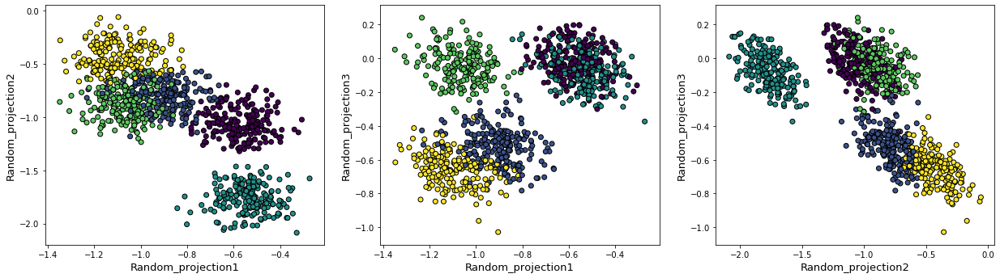

Score for iteration 5: -50.703032628519225
Silhouette score for iteration 5: 0.5493435227298064
V-measure score for iteration 5: 0.8523814186465795
----------------------------------------------------------------------------------------------------


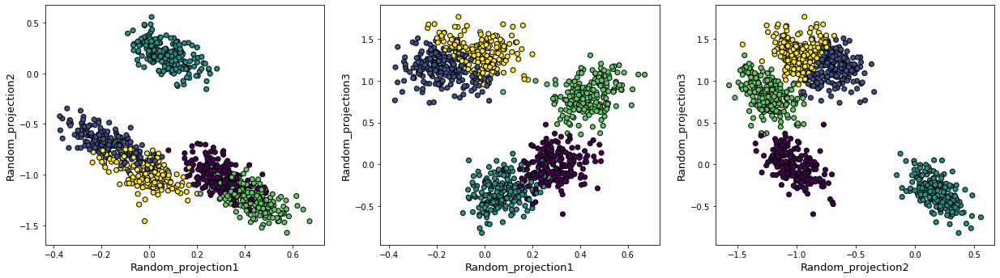

Score for iteration 6: -30.188858687425512
Silhouette score for iteration 6: 0.5764602979325998
V-measure score for iteration 6: 0.8486647572336747
----------------------------------------------------------------------------------------------------


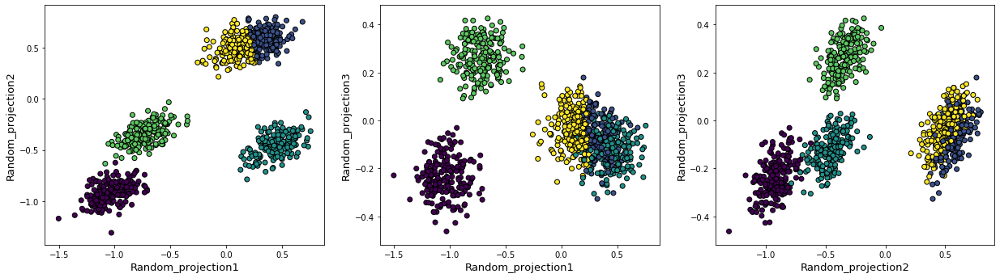

Score for iteration 7: -51.158156996340196
Silhouette score for iteration 7: 0.5836998710425388
V-measure score for iteration 7: 0.9262677797809904
----------------------------------------------------------------------------------------------------


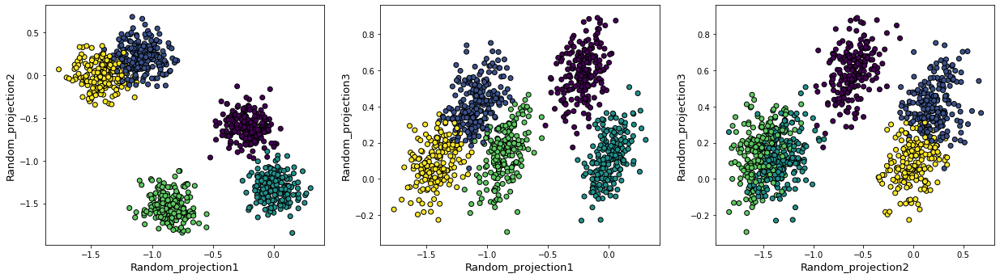

Score for iteration 8: -36.6825047322101
Silhouette score for iteration 8: 0.4315303656193039
V-measure score for iteration 8: 0.7586954859997763
----------------------------------------------------------------------------------------------------


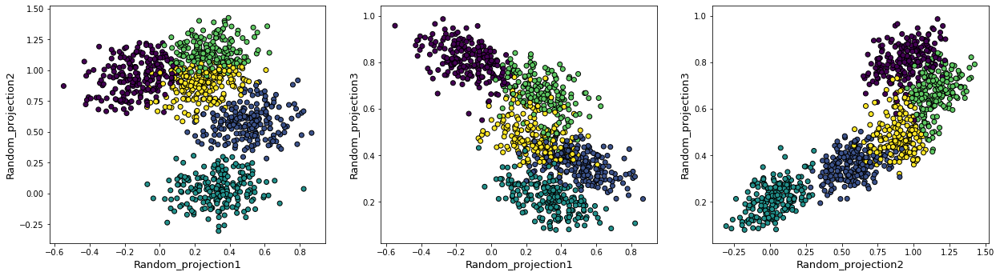

Score for iteration 9: -31.954095479665376
Silhouette score for iteration 9: 0.45341026703247644
V-measure score for iteration 9: 0.8197305198369835
----------------------------------------------------------------------------------------------------


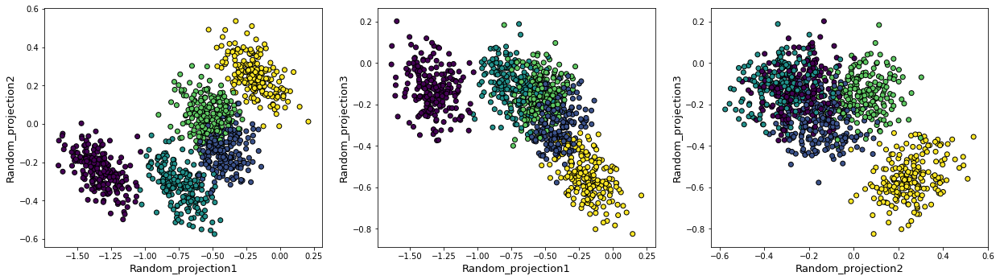

Score for iteration 10: -30.263160030155053
Silhouette score for iteration 10: 0.5639448587785377
V-measure score for iteration 10: 0.9465920416452358
----------------------------------------------------------------------------------------------------


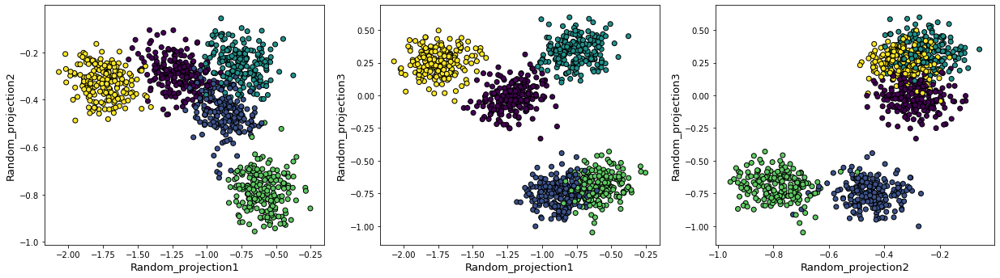

Score for iteration 11: -16.26174056767377
Silhouette score for iteration 11: 0.5045544864844489
V-measure score for iteration 11: 0.8446228059688639
----------------------------------------------------------------------------------------------------


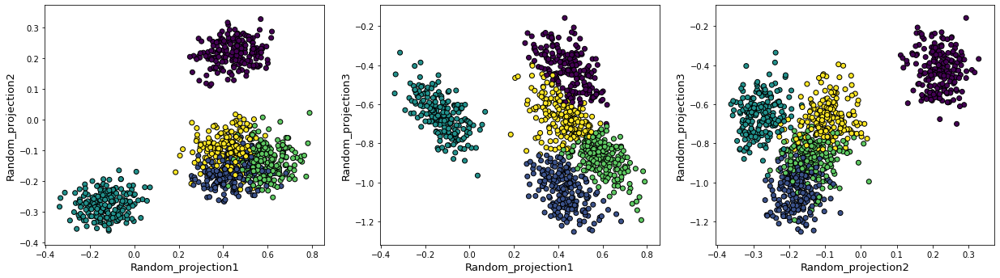

Score for iteration 12: -39.75670303870347
Silhouette score for iteration 12: 0.6614016801034506
V-measure score for iteration 12: 0.9762714099836597
----------------------------------------------------------------------------------------------------


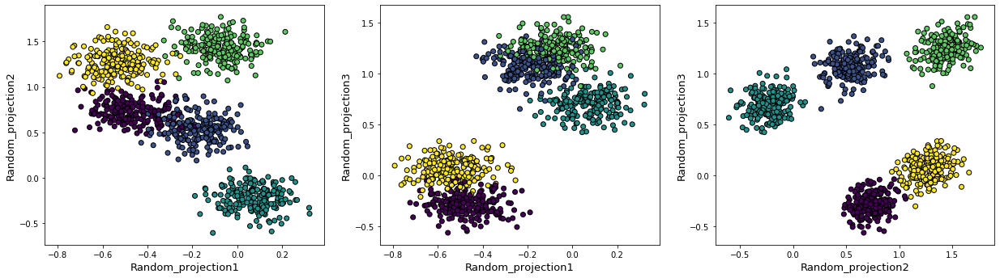

Score for iteration 13: -40.76685053405378
Silhouette score for iteration 13: 0.4709222877656498
V-measure score for iteration 13: 0.8695749238837768
----------------------------------------------------------------------------------------------------


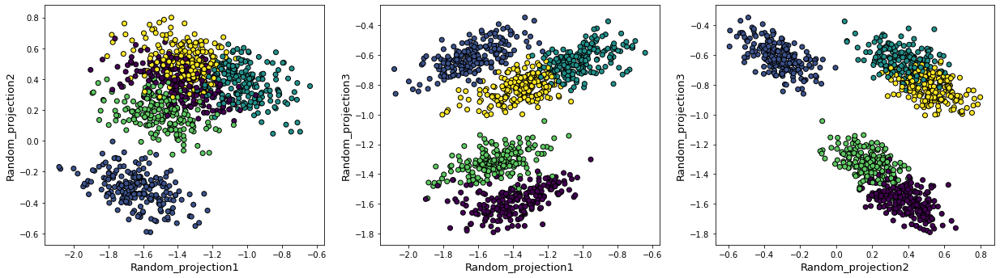

Score for iteration 14: -32.428063979414084
Silhouette score for iteration 14: 0.4496668898837258
V-measure score for iteration 14: 0.7990388130829865
----------------------------------------------------------------------------------------------------


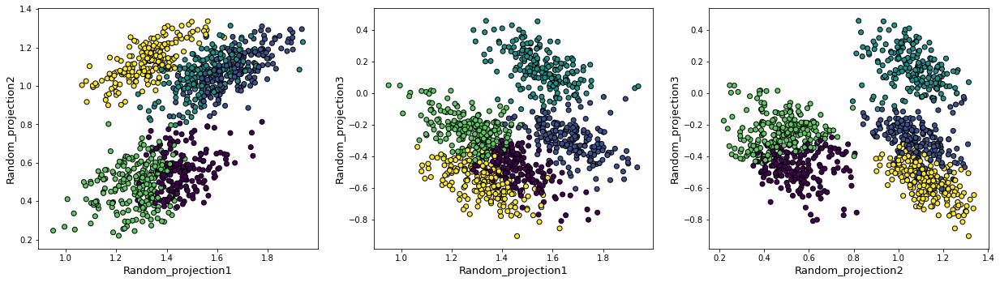

Score for iteration 15: -72.12956650193284
Silhouette score for iteration 15: 0.532959755308602
V-measure score for iteration 15: 0.9371714956071869
----------------------------------------------------------------------------------------------------


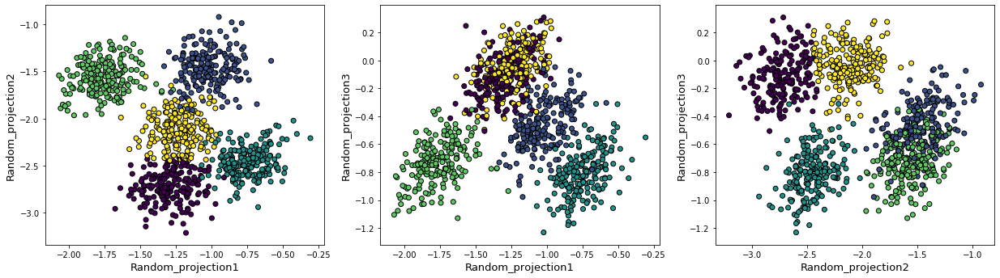

Score for iteration 16: -30.453807435915124
Silhouette score for iteration 16: 0.47292142033430906
V-measure score for iteration 16: 0.8363298056849503
----------------------------------------------------------------------------------------------------


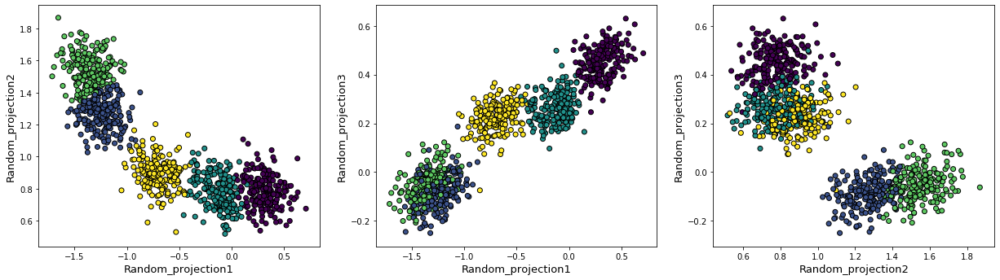

Score for iteration 17: -34.76048339697995
Silhouette score for iteration 17: 0.5431938178650002
V-measure score for iteration 17: 0.9186569434911229
----------------------------------------------------------------------------------------------------


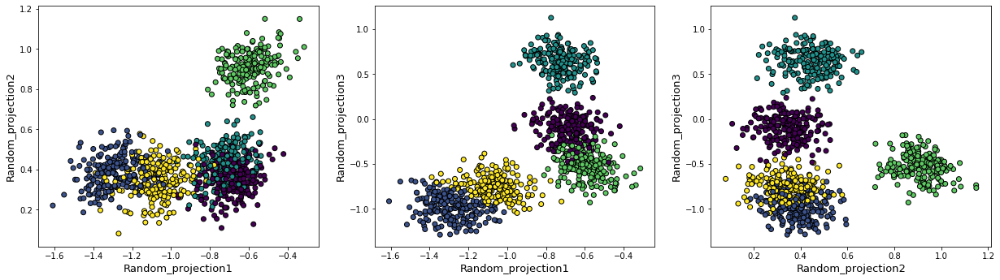

Score for iteration 18: -38.54772804048662
Silhouette score for iteration 18: 0.4541272281229083
V-measure score for iteration 18: 0.8413773212910352
----------------------------------------------------------------------------------------------------


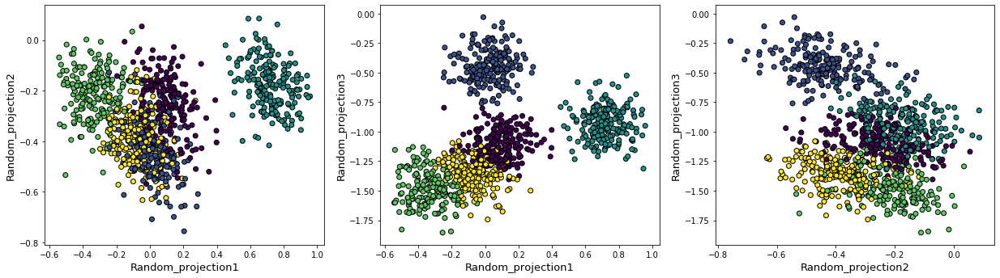

Score for iteration 19: -47.74558219835329
Silhouette score for iteration 19: 0.5031626197837167
V-measure score for iteration 19: 0.8183134789777373
----------------------------------------------------------------------------------------------------


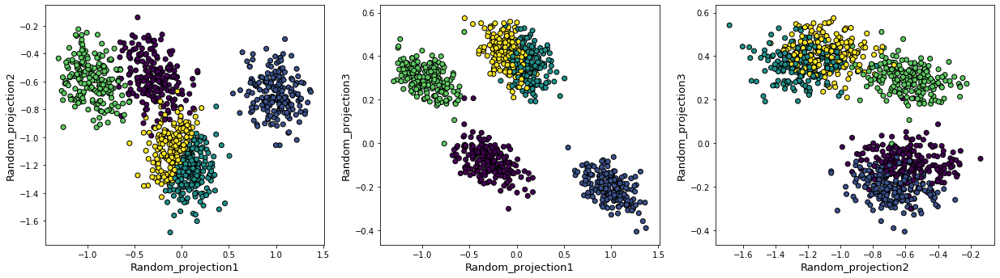

In [135]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

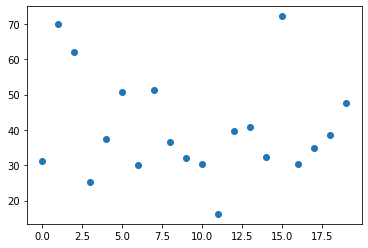

In [136]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

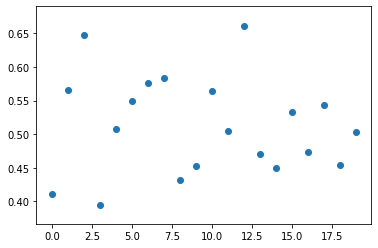

In [137]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

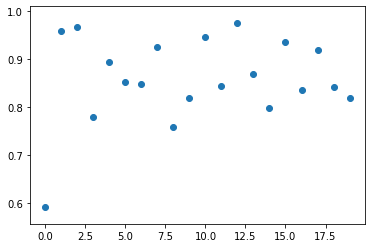

In [138]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [139]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -20.175619303900262
Silhouette score for iteration 0: 0.7084008285054048
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -20.175619303900262
Silhouette score for iteration 1: 0.7084008285054048
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -20.175619303900262
Silhouette score for iteration 2: 0.7084008285054048
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -20.175619303900262
Silhouette score for iteration 3: 0.7084008285054048
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -20.175619303900262
Silhouette score for 